In [2]:
import pandas as pd
import geopandas as gpd
import osmnx as ox
import matplotlib.pyplot as plt
import plotly as py
from shapely.geometry import Point, Polygon
import plotly.express as px
import requests
import json

%matplotlib inline

Paris is hosting the Paralympics in 2024. One of the events at the Paralympics is an open water
swimming event in the Seine (apparently the water is clean or so the French say). Since the City
of Amsterdam thinks it is beter than Paris, they want to host an event before the Paralympics,
snubbing the Parisians. The idea is to host a 5km. open water swimming event through the
canals of Amsterdam. You are asked by the municipality of Amsterdam to advise on the
feasibility of the event from the perspecptive of the safety of the partaking athletes from an
environmental perspective. The event is going to be hosted in May.

For this exercise you have chosen a route in Amsterdam for the canal swimming event.
Preferably you have this route calculated using Python. You can set a start point and an end
point and then try to find a route that has a certain distance (min. 5 km.)

The Municipality wants you to find a location for the Event Headquarters. They decided it
would be best if this E.H. is as close to the centre of the swimming route. There is a bit of a
concern for the after party and the stream of visitors. They want you to quantify the number of
visitors that can reach the event and the capacity for festivities after the event

Location of swimming route is calculated based on previous findings

In [3]:
city_name = "Amsterdam"

water = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})

C:\Users\julia\AppData\Local\Temp\ipykernel_11008\240874422.py:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})


In [4]:
url_pol = "https://maps.amsterdam.nl/open_geodata/geojson_lnglat.php?KAARTLAAG=RAINPROOF_POLDERRIOOL&THEMA=rainproof"
response_pol = requests.get(url_pol)
gdf_pol = gpd.read_file(response_pol.text)

In [5]:
gdf_boat = gpd.read_file("Amsterdam_canal_routes.geojson")

In [6]:
df_zwemwater =  pd.read_csv("ZWEMWATER.csv", sep = ";")
df_zwemplek = df_zwemwater[df_zwemwater['Categorie']=="Zwemplek"]
print(df_zwemplek.head())
gdf_zwemplek = gpd.GeoDataFrame(df_zwemplek[['OBJECTNUMMER', "LNG", "LAT", "Categorie"]],
    geometry=gpd.points_from_xy(df_zwemplek.LNG, df_zwemplek.LAT), crs="WGS84")

    OBJECTNUMMER                 Naam_locatie Categorie  \
0             43                  Nieuwe Meer  Zwemplek   
6             57                   Diemerpark  Zwemplek   
7             59                  Gaasperplas  Zwemplek   
8             60  Zandstrand, Ouderkerkerplas  Zwemplek   
21           130                Strand IJburg  Zwemplek   

                    WKT_LNG_LAT                  WKT_LAT_LNG       LNG  \
0   POINT(4.8466042 52.3329068)  POINT(52.3329068 4.8466042)  4.846604   
6   POINT(4.9864841 52.3542671)  POINT(52.3542671 4.9864841)  4.986484   
7   POINT(4.9966011 52.3033752)  POINT(52.3033752 4.9966011)  4.996601   
8    POINT(4.929492 52.2950172)   POINT(52.2950172 4.929492)  4.929492   
21  POINT(5.0148267 52.3569806)  POINT(52.3569806 5.0148267)  5.014827   

          LAT  Unnamed: 7  
0   52.332907         NaN  
6   52.354267         NaN  
7   52.303375         NaN  
8   52.295017         NaN  
21  52.356981         NaN  


In [7]:
df_swimm =  pd.read_csv("Swimming.csv")
print(df_swimm.head())
gdf_swimm = gpd.GeoDataFrame(df_swimm[['place', "LNG", "LAT"]],
    geometry=gpd.points_from_xy(df_swimm.LAT, df_swimm.LNG), crs="WGS84")

                           place        LNG       LAT
0                     sloterplas  52.368439  4.822760
1                  Marineterrein  52.373323  4.915827
2                     Het Twiske  52.449236  4.887567
3  Admiralengracht, erasmus park  52.376215  4.854653
4        Berlagebrug Rowing Club  52.348145  4.912280


In [8]:
fig, ax = plt.subplots(figsize=(200,200))
ax.set_aspect('equal')
ax.set_facecolor('#D3D3D3')

water.plot(ax=ax, color="#3EA9D7")
gdf_zwemplek.plot(ax=ax, marker = 'o', markersize = 3000, color="#FF8700")
gdf_pol.plot(ax=ax, color= "#BE0CF5")
gdf_swimm.plot(ax=ax, marker = 'o', markersize = 3000, color="#FFC300")
gdf_boat.plot(ax=ax, color= "#D22B2B", linewidth = 20)

plt.savefig("waterways_amsterdam.png")

In [9]:
city_name = "Centrum Amsterdam"

water_center = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})

C:\Users\julia\AppData\Local\Temp\ipykernel_11008\3385034054.py:3: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water_center = ox.geometries.geometries_from_place( city_name, tags={'natural' : 'water'})


In [10]:
fig, ax = plt.subplots(figsize=(200,200))
ax.set_aspect('equal')
ax.set_facecolor('#D3D3D3')

water_center.plot(ax=ax, color="#ffffff")
# all the zempleks in amsterdam are too far out of the city center thus to low connectivity
#gdf_zwemplek.plot(ax=ax, marker = 'o', markersize = 3000, color="#FFC300")
gdf_swimm.plot(ax=ax, marker = 'o', markersize = 3000, color="#FFC300")
gdf_boat.plot(ax=ax, color= "#D22B2B", linewidth = 50)

# plt.savefig("waterways_amsterdam.png")

<Axes: >

Find the centre of the nodes of the swimming route. See this link. - julian

C:\Users\julia\AppData\Local\Temp\ipykernel_11008\1315976270.py:2: UserWarning: The `utils.config` function is deprecated and will be removed in a future release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`.
  ox.config(use_cache=True, log_console=True)


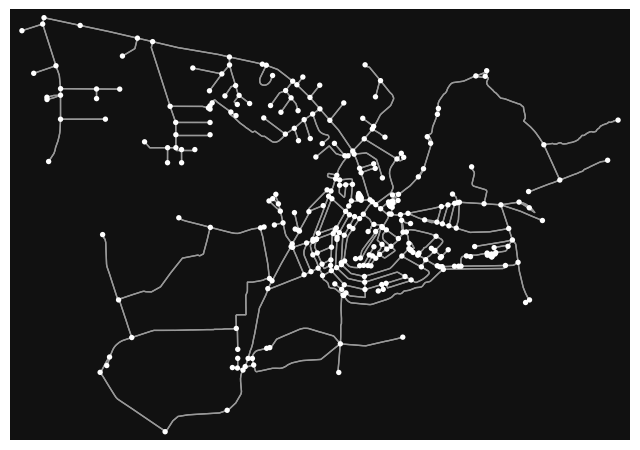

In [11]:
import osmnx as ox
ox.config(use_cache=True, log_console=True)
graph_water = ox.graph_from_place('Amsterdam', retain_all=False, truncate_by_edge=False,
                        simplify=True, custom_filter='["waterway"~"canal"]')
fig, ax = ox.plot_graph(graph_water)

In [12]:
node_id = list(graph_water.nodes)[0]
print(graph_water.nodes)

[46367195, 60739108, 60740168, 60740843, 60740852, 60742002, 117738457, 117738466, 117738475, 117738484, 117738490, 117738503, 117738509, 117908628, 117953816, 117953820, 154512118, 154515615, 154516859, 154538128, 154546029, 178249893, 178249922, 178261156, 178261159, 178261171, 178269153, 178287360, 237852499, 237852501, 237852504, 237852506, 251749021, 251764623, 251823620, 251823623, 251823628, 252100239, 252116496, 252116503, 252142901, 277138134, 277141215, 277141219, 277141224, 288315918, 288316157, 301390460, 301487539, 301492457, 304072208, 304072209, 304817737, 304820077, 304825773, 305081090, 305081097, 305082709, 305083121, 305084168, 305084619, 305085083, 305085205, 305085534, 305086630, 305086634, 305155547, 305155548, 305156166, 311306136, 311308968, 311319542, 322374080, 322375093, 323521776, 323525433, 323895952, 323901705, 323909108, 323909176, 323929882, 323968073, 323991338, 324010766, 324023636, 324089287, 324126395, 324128505, 324795591, 324795903, 324817669, 3248

In [13]:
# swimming_route_nodes = [323901852, 252142901, 331854233, 1280741285, 1146370151, 252111331, 7517098403, 178287382, 323929882, 324817202, 1146370114, 7517097397, 178287378, 323960830, 1146370149, 5924650337, 4446826075, 1146370142, 60740166, 178249906, 60740168, 323968073, 178287355, 178287357, 178287360, 252100239, 252100242, 5828130167, 323974742, 323974741, 323974740, 855298916, 323974739, 855298910, 323974738, 324814425, 324814546, 324814401, 324814399, 3781170134, 1276480053, 324815676, 2853837615, 323926433, 297863497, 323926433, 2853837615, 252116497, 323927212, 323909176, 252116496, 1280741337, 331854233, 252142901]

import gpxpy
import gpxpy.gpx

# read the swim route from the gpx file
import codecs
gpx_file = codecs.open('./swim_route.gpx', 'r', encoding='utf-8')
swim_route_gpx = gpxpy.parse(gpx_file)
gpx_file.close()
swim_route = []
for track in swim_route_gpx.tracks:
    for segment in track.segments:
        for point in segment.points:
            # find the nearest node in the graph_water for each coordinate
            nearest_node = ox.distance.nearest_nodes(graph_water, point.longitude, point.latitude, return_dist=True)
            if nearest_node[1] < 10:
                swim_route.append(nearest_node[0])

# remove duplicates from the swim route
swim_route_deduplicated = []
prev_elem = None
for elem in swim_route:
    if elem != prev_elem:
        swim_route_deduplicated.append(elem)
    prev_elem = elem
print(swim_route_deduplicated)

# find the shortest path between the nodes in the swim route
import networkx as nx
swim_route_path = []
for i in range(len(swim_route_deduplicated) - 1):
    path = nx.shortest_path(graph_water, swim_route_deduplicated[i], swim_route_deduplicated[i+1])
    swim_route_path.extend(path[1:]) # add all nodes except the first one to the path
print(swim_route_path)



[252142901, 331854233, 323929882, 60740168, 323968073, 178287360, 252100239, 3781170134, 2853837615, 323909176, 252116496, 8010136114, 331854233, 252142901]
[331854233, 323929882, 178261159, 178261156, 117738509, 60740168, 323968073, 178287360, 252100239, 3781170134, 2853837615, 323909176, 252116496, 8010136114, 331854233, 252142901]


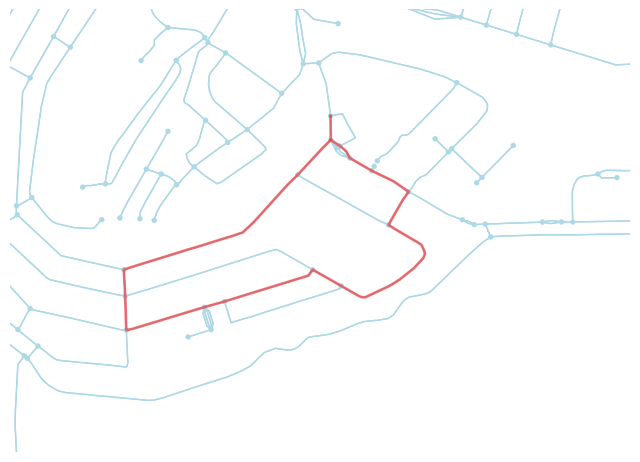

In [14]:
# plot the swim route on top of the water graph
bbox_ams_centre = (52.378324, 52.355264, 4.939041, 4.886169)
swim_route_fig, ax = ox.plot_graph_route(graph_water, swim_route_path, route_linewidth=2, route_color='red', show=True, orig_dest_size=2, bgcolor='white', node_color="lightblue", edge_color="lightblue", bbox=bbox_ams_centre, close=False)

Use the centre to find a suitable spot for the Event Headquarters. - julian

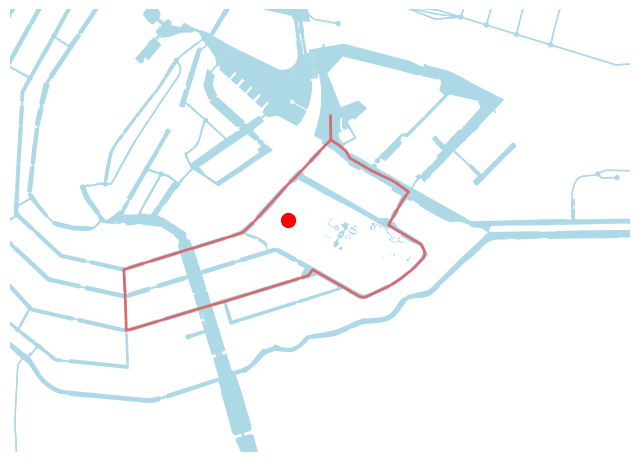

In [15]:
# find the nodes in the swim route
swim_route_nodes = []

for node in swim_route_path:
    swim_route_nodes.append(graph_water.nodes[node])

# find the centre of all the nodes in the swim route
average_x = 0.0
average_y = 0.0
for node in swim_route_nodes:
    average_x = average_x + node['x']
for node in swim_route_nodes:
    average_y = average_y + node['y']

average_x = average_x / len(swim_route_nodes)
average_y = average_y / len(swim_route_nodes)

# plot the centre of the swim route on the swim_route_fig
swim_route_fig, ax = ox.plot_graph_route(graph_water, swim_route_path, route_linewidth=2, route_color='red', show=False, orig_dest_size=2, bgcolor='white', node_color="lightblue", edge_color="lightblue", bbox=bbox_ams_centre, close=False)
water_center.plot(ax=ax, color="lightblue")
ax.scatter(average_x, average_y, s=100, c='red', marker='o', zorder=2)
plt.show()

Find the closest bus and tram stops at the start and finish of the swimming route. How many people can be transported within an hour. - Lora



In [18]:
print(swim_route_nodes[0])
print(swim_route_nodes[-1])

{'y': 52.3715129, 'x': 4.9135219, 'street_count': 5}
{'y': 52.3727643, 'x': 4.9135033, 'street_count': 3}


In [ ]:
#start of the swimming route :  331854233
#end of the swimming route : 252142901

place_name = "Amsterdam, the Netherlands"  
G = ox.graph_from_place(place_name, network_type="all")

node_ids = [331854233,252142901]  
graph_1 = []


# nearest bus stops
nearest_stops = []
for node_id in node_ids:
    nearest_stop = ox.distance.nearest_nodes(g,[node_ids])
    nearest_stops.append(nearest_stop)
# coordinates of the bus stops
closest_stops_coordinates = [(graph.nodes[stop]["x"], graph.nodes[stop]["y"]) for stop in nearest_stops]


Can you find which bus and tram lines these are, and can you find their routes? - Lora
maps amsterdam - has  a geojson of all metro, tram and bus in the area


Calculate the centrality of the start, finish, and centre node of the route. Which centrality calculatuon for non makes the most sense. See this link.

- Camille

Find all cafes, restaurants near the finish line. Walking me smaller than 10 minutes. - Camille